# Download dataset & install dependecies

In [0]:
# Download and unzip dataset
! wget http://files.grouplens.org/datasets/movielens/ml-latest-small.zip
! unzip ml-latest-small.zip
! rm ml-latest-small.zip

In [0]:
# Download 20M Movielens
! wget http://files.grouplens.org/datasets/movielens/ml-20m.zip
! unzip ml-20m.zip
! rm ml-20m.zip

In [0]:
# To get movie image
# https://pypi.org/project/tmdbsimple/
! pip install tmdbsimple
# To print model as SVG
! pip install pydot
! pip install graphviz
! apt-get install graphviz

# Study dataset

['seaborn-ticks', 'seaborn-paper', 'seaborn-dark', 'seaborn-darkgrid', 'seaborn-talk', 'tableau-colorblind10', 'seaborn-poster', 'seaborn-dark-palette', 'seaborn-notebook', 'seaborn-colorblind', 'seaborn-white', 'seaborn-bright', 'seaborn-whitegrid', 'grayscale', 'seaborn-pastel', 'ggplot', 'fast', 'seaborn-deep', 'seaborn', 'fivethirtyeight', 'bmh', 'dark_background', '_classic_test', 'Solarize_Light2', 'classic', 'seaborn-muted']


<Figure size 28800x28800 with 0 Axes>

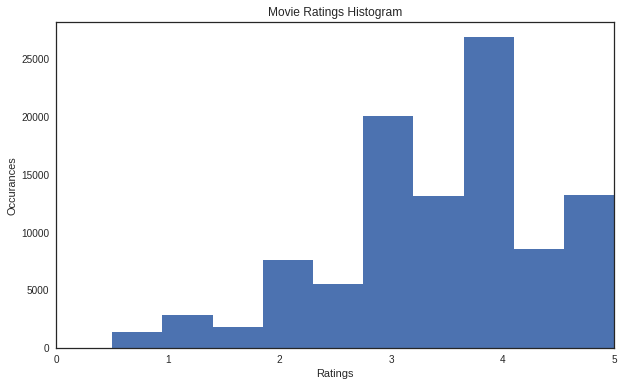

In [0]:
# Configuration
import matplotlib as mpl
import matplotlib.pyplot as plt

print(plt.style.available)
mpl.style.use('seaborn-white')

import matplotlib.pyplot as plt
plt.figure(figsize=(400, 400))


import numpy as np
import pandas as pd

data = pd.read_csv('./ml-latest-small/ratings.csv')

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
plt.hist(data['rating'],10)
plt.xlabel('Ratings'); 
plt.ylabel('Occurances')
plt.xlim(0,5)
plt.title('Movie Ratings Histogram')
plt.show()

Users bot:  300
[1.0, 4.0, 5.0, 6.0, 8.0, 9.0, 11.0, 13.0, 14.0, 19.0, 26.0, 27.0, 31.0, 32.0, 33.0, 35.0, 37.0, 38.0, 39.0, 40.0, 42.0, 43.0, 44.0, 45.0, 46.0, 54.0, 56.0, 57.0, 58.0, 59.0, 69.0, 71.0, 79.0, 81.0, 82.0, 84.0, 85.0, 89.0, 90.0, 91.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 101.0, 102.0, 104.0, 105.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 115.0, 117.0, 118.0, 120.0, 121.0, 126.0, 128.0, 130.0, 133.0, 134.0, 135.0, 136.0, 139.0, 140.0, 142.0, 145.0, 148.0, 149.0, 150.0, 151.0, 154.0, 155.0, 156.0, 157.0, 160.0, 162.0, 163.0, 164.0, 165.0, 166.0, 169.0, 170.0, 171.0, 173.0, 174.0, 176.0, 177.0, 179.0, 181.0, 183.0, 185.0, 186.0, 188.0, 191.0, 192.0, 195.0, 197.0, 198.0, 199.0, 201.0, 202.0, 203.0, 206.0, 208.0, 214.0, 216.0, 217.0, 224.0, 225.0, 226.0, 229.0, 234.0, 235.0, 236.0, 238.0, 240.0, 242.0, 243.0, 244.0, 245.0, 255.0, 257.0, 260.0, 262.0, 263.0, 265.0, 266.0, 267.0, 268.0, 269.0, 270.0, 273.0, 274.0, 275.0, 276.0, 277.0, 283.0, 284.0, 288.0, 290.0, 

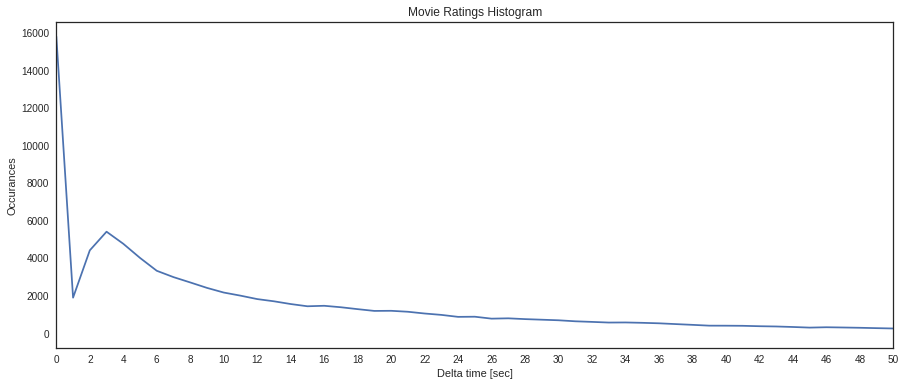

In [0]:

data = pd.read_csv('./ml-latest-small/ratings.csv')

data = data.sort_values(by=['userId', 'timestamp'])


current_user_id = -1
prev_time = -1

time_beteween_ratings = []
users_bot = []
zeros_delta = 0

for index, row in data.iterrows():
    if row['userId'] != current_user_id:
        current_user_id = row['userId']
        prev_time = row['timestamp']
        continue
    
    if row['timestamp'] == prev_time:
        zeros_delta += 1
        
        if row['userId'] not in users_bot:
            users_bot.append(row['userId'])
    
    time_beteween_ratings.append(row['timestamp'] - prev_time)
    
    current_user_id = row['userId']
    prev_time = row['timestamp']


print('Users bot: ', len(users_bot))
print(users_bot)

print('Zéros delta, ', zeros_delta)
    
time_beteween_ratings = np.array(time_beteween_ratings)
time_beteween_ratings.sort()



# Convert seconds to hours
time_beteween_ratings = (time_beteween_ratings).astype(int)


#time_beteween_ratings //= (60*60)

print(time_beteween_ratings.mean())

time_beteween_ratings, occurance = np.unique(time_beteween_ratings, return_counts=True)

print('Time between rating')
print(time_beteween_ratings)
print('occurance')
print(occurance)

print(time_beteween_ratings.shape)

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (15, 6)

fig, ax = plt.subplots(1, 1)
plt.plot(time_beteween_ratings, occurance)
plt.xlabel('Delta time [sec]'); 
plt.ylabel('Occurances')
plt.xlim(0, 50)
plt.xticks(np.arange(0, 51, 2))
plt.title('Movie Ratings Histogram')
plt.show()


99947
128
1
[  1   2   3   4   5   6   7   8   9  10  12  18  20  21  23  30  37  85
 124 128]
[77092  3338  1930  1077   624   211   104    28    13     7     1     1
     1     2     1     1     2     1     1     1]


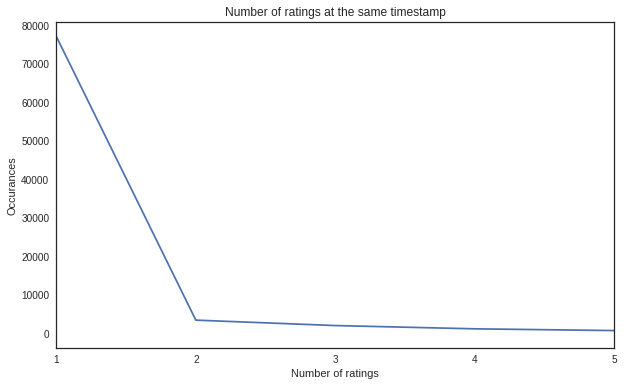

In [0]:
data = pd.read_csv('./ml-latest-small/ratings.csv')

data = data.sort_values(by=['userId', 'timestamp'])

current_user_id = -1
current_timestamp = -1

counter = 0

number_of_rating_at_the_same_time = []

for index, row in data.iterrows():
    if row['userId'] != current_user_id:
        current_user_id = row['userId']
        current_timestamp = row['timestamp']
        counter = 1
        continue
    
    if row['timestamp'] == current_timestamp:
        counter += 1
    else:
        number_of_rating_at_the_same_time.append(counter)
        current_timestamp = row['timestamp']
        counter = 1
        
print(sum(number_of_rating_at_the_same_time))   
print(max(number_of_rating_at_the_same_time))   
print(min(number_of_rating_at_the_same_time))   

rating_at_the_same_time, number_of_rating_at_the_same_time = np.unique(number_of_rating_at_the_same_time, return_counts=True)

print(rating_at_the_same_time)
print(number_of_rating_at_the_same_time)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
plt.plot(rating_at_the_same_time, number_of_rating_at_the_same_time)

plt.xticks(np.arange(1, 6))

plt.xlabel('Number of ratings'); 
plt.ylabel('Occurances')
plt.title('Number of ratings at the same timestamp')
plt.xlim(1, 5)
plt.xticks(np.arange(1, 6, 1))
plt.show()


# Loading dataset

In [0]:
import numpy as np
import pandas as pd


class Dataset(object):
    """
    Abstract class, minimals methods for dataset classes...
    """
    def __init__(self, directory):
        # These variables must be calculated
        self.n_items = None
        self.n_users = None
        
        # List of all items ID and user ID
        self.items_id = np.array([])
        self.users_id = np.array([])
        
        # Reverse dictionnary '{item_id: u_item_id}'
        self.u_users_id = {}
        self.u_items_id = {}
        
        # Pandas dataframe
        # Column: user_id, item_id, rating, timestamp, u_item_id, u_user_id
        # u_item_id, u_user_id are unique and contigous id, position of the rating in the rating_matrix
        self.pd_ratings = None
            
    def __iter__(self):
        # Iter over rating in the dataset
        raise NotImplementedError('subclasses must override __iter__()!')
    
    def __next__(self):
        # Get next rating, should return (user_id, item_id, rating, u_user_id, u_item_id)
        raise NotImplementedError('subclasses must override __next__()!')

In [0]:
class MovieLens(Dataset):
    """
    MovieLens dataset
    
    > https://grouplens.org/datasets/movielens/
    """
    def __init__(self, directory, shuffle_when_iter = True):
        """
        Initialize dataset class
        
        Params
        ======
        - directory (str) : directory where is the CSV files        
        """
        
        # Load pd_ratings
        self.pd_ratings = pd.read_csv(directory + 'ratings.csv')
        self.pd_ratings.columns = ['user_id', 'item_id', 'rating', 'timestamp']
        
        # Users ID
        self.users_id = self.pd_ratings['user_id'].unique()    
        self.users_id.sort()
        self.u_users_id = { user_id : u_user_id for u_user_id, user_id in enumerate(self.users_id) }        
        self.pd_ratings['u_user_id'] = [self.u_users_id[user_id] for user_id in self.pd_ratings['user_id'].values]
        
        # Items ID
        self.items_id = self.pd_ratings['item_id'].unique()
        self.items_id.sort()
        self.u_items_id = { item_id : u_item_id for u_item_id, item_id in enumerate(self.items_id) }
        self.pd_ratings['u_movie_id'] = [self.u_items_id[item_id] for item_id in self.pd_ratings['item_id'].values]
         
        # Number of users/items
        self.n_items = self.items_id.size
        self.n_users = self.users_id.size
        
        # Update coumns
        self.pd_ratings.columns = ['user_id', 'item_id', 'rating', 'timestamp', 'u_user_id', 'u_item_id']
        
        # Movies informations
        self._movies = pd.read_csv(directory + 'movies.csv')
        
        # Pandas csv of movies titles and genres
        self._all_genres = np.unique('|'.join(self._movies['genres']).split('|'))
        
        self._shuffle_when_iter = shuffle_when_iter
    
    @property
    def pd_ratings_matrix(self):
        return self.pd_ratings.pivot(index='user_id', columns='item_id', values='rating').fillna(0)
    
    @property 
    def ratings_matrix(self):
        return self.pd_ratings_matrix.as_matrix()
    
    @property
    def pd_normalized_ratings(self):
        """
        Normalize pd_ratings using users mean and standard deviation
        """        
        pd_ratings = self.pd_ratings
        
        pd_normalized_ratings_ = pd_ratings
                
        pd_ratings_user_grouper = pd_ratings.groupby('u_user_id')
        
        pd_normalized_ratings_['rating'] = pd_ratings_user_grouper['rating'].apply(lambda x: (x - x.mean()) / x.std())
        
        return pd_normalized_ratings_
    
    def __iter__(self):
        """
        Iter over ratings
        """
        if self._shuffle_when_iter:
            self.pd_iter_ratings = movielens.pd_ratings.sample(frac=1)
        else:
            self.pd_iter_ratings = movielens.pd_ratings
        
        self.iterator = self.pd_iter_ratings.iterrows()
        
        return self
    
    def __next__(self):
        """
        Iter over ratings
        """
        index, row = next(self.iterator)
                        
        return int(row['user_id']), int(row['item_id']), row['rating'], row['timestamp'], int(row['u_user_id']), int(row['u_item_id'])
    
    def movie_genres(self, movie_id):
        """
        Return genres from movie ID

        Params
        ======
        - movie_id (int): ID of the target movie
        """

        if movie_id not in self._movies['movieId'].values:
            return []

        genres = self._movies[self._movies['movieId']==movie_id]['genres'].values[0].split('|')
        return genres
    
    def movie_name(self, movie_id):
        """
        Return name from movie ID

        Params
        ======
        - movie_id (int): ID of the target movie
        """

        if movie_id not in self._movies['movieId'].values:
            return []

        name = self._movies[self._movies['movieId']==movie_id]['title'].values[0]

        if not name:
            return ''

        return name

    def movie_average_rate(self, movie_id):
        """
        Return the average of all users ratings

        Params
        ======
        movie_id (int) : Target movie
        """
        rates = self.pd_ratings[self.pd_ratings['item_id']==movie_id]['rating']

        if np.isnan(rates.mean()):
            return -1

        return rates.mean()
    
    def search_movie(self, movie_name):
        """
        Return the movie_id from the movie_name
        
        Params
        ======
        - movie_name (str) : Name of the movie
        """
        
        movie_name = movie_name.lower()
        
        for _, movie in self._movies.iterrows():
            if movie_name in movie['title'].lower():
                return movie['movieId']
        
        return -1
            

directory = './ml-latest-small/'

movielens = MovieLens(directory)

movielens.search_movie('fight club')

2959

# Visualization

In [0]:
arrow_url = 'https://image.flaticon.com/icons/png/512/54/54366.png'

In [0]:
# Visualization
import tmdbsimple as tmdb
import IPython.display
import re


tmdb.API_KEY = '4df15aadc9a772800fc02345b6a0cd31'

def print_movie_image(movie_name, width=185, show=True):
    """
    Use the API 'tmdbsimple' to get an image from a movie name
    
    Params
    ======
    - movie_name (str) : name of the movie to search, only the first result will be kept
    - width (int)      : width of the image
    - show (bool)      : show the image or not in the console
    
    Ret
    ===
    - URL (str)        : URL of the image
    """
    # Remove parenthesis    
    if not movie_name:
        raise 'Error, no movie_name'
    movie_name = re.sub(r"\(.+\)", "", movie_name)

    
    search = tmdb.Search()
    esponse = search.movie(query=movie_name)
    if len(search.results) == 0 or not search.results[0]:
        print("<No movie found with this name>")
        return ''
    
    movie = search.results[0]
    
    if not movie['poster_path']:
        print("<No movie found with this name>")
        return ''
    
    URL = 'http://image.tmdb.org/t/p/w%i' % width + movie['poster_path']
    if show: IPython.display.display(IPython.display.Image(URL))
    
    return URL

In [0]:
from PIL import Image, ImageDraw
import IPython
import requests

def show_multiple_images(urls, zoomed=False):
    
    result = Image.new("RGBA", (200 * 7, 300 * ((len(urls)-1) // 7+1)), color=(0, 0, 0, 0))

    for index, url in enumerate(urls):                
        x = (index % 7) * 200
        y = (index // 7) * 300
        
        if len(url) == 0:
            d = ImageDraw.Draw(result)
            d.text((x,y), "<no image>", fill=(0,0,0))
            continue
        
        response = requests.get(url, stream=True)
        response.raw.decode_content = True
        img = Image.open(response.raw)
        
        img.thumbnail((900, 400), Image.ANTIALIAS)
        
        if url == arrow_url:
            img.thumbnail((100, 100), Image.ANTIALIAS)
            w, h = img.size
            x_ = x + 40
            y_ = y + 90
            result.paste(img, (x_, y_, x_ + w, y_ + h))
        else:
            w, h = img.size
            result.paste(img, (x, y, x + w, y + h))
    
    if not zoomed:
        result.thumbnail((result.width * 0.6, result.height * 0.6), Image.ANTIALIAS)
    
    IPython.display.display(result)
    

def show_movies(movies_id, movielens, zoomed=False):
    """
    Show movie from id
    
    Params
    ======
    - movies_id (list(int)) : List of ID
    - movielens (MovieLens) : Dataset classe, used to get movie title from movie ID
    """
    urls = []
    
    for id in movies_id:
        if id is None:
            urls.append(arrow_url)
            continue
        title = movielens.movie_name(id)
        if not title: 
            print('Movie not found, ', id)
            continue
        urls.append(print_movie_image(title, show=False))
    
    return show_multiple_images(urls, zoomed)   

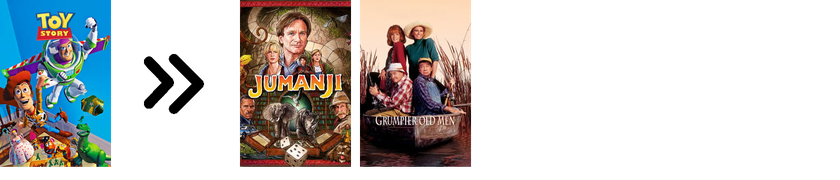

In [0]:
show_movies([1, None, 2, 3], movielens)

# Content based

In [0]:
import re

def vectorize_movie(movie_id, movielens):
    """
    Return a array of caracteristiques corresponding to the movie
    
    Params
    ======
    - movie_id(int)  : Target movie id
    - movies (pd.df) : All movies informations
    """
       
    vector = movielens.movie_genres(movie_id) + ['rating_' + str(int(movielens.movie_average_rate(movie_id)))]
    
    if movielens.movie_name(movie_id):
        year = re.search(r'(?<=\().+(?<=\))', movielens.movie_name(movie_id))
        if year is not None:
            vector.append(year.group(0)[:-1])
    
    return np.array(vector)

In [0]:
def content_based_recommendation(movie_id, movielens, k=5):
    """
    Recommend K movies similar to the 'movie_id'
    
    Params
    ======
    - movie_id (int)        : Target movie
    - movielens (MovieLens) : MovieLens dataset class
    - k (int)         : Number of movie to recommend
    """
    
    a = vectorize_movie(movie_id, movielens)
    
    best_movies = [[0, -1, None]] * k
    
    for movie in movielens.items_id:
        
        if movie == movie_id:
            continue

        b = vectorize_movie(movie, movielens)
        
        sim = np.sum(np.in1d(a, b).astype(int))

        if sim > best_movies[0][0]:
            del best_movies[0]
            best_movies.append([sim, movie])
            best_movies.sort()
    
    best_movies = np.array(best_movies)
    return best_movies[:, 1].reshape(1, -1)[0][::-1]

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


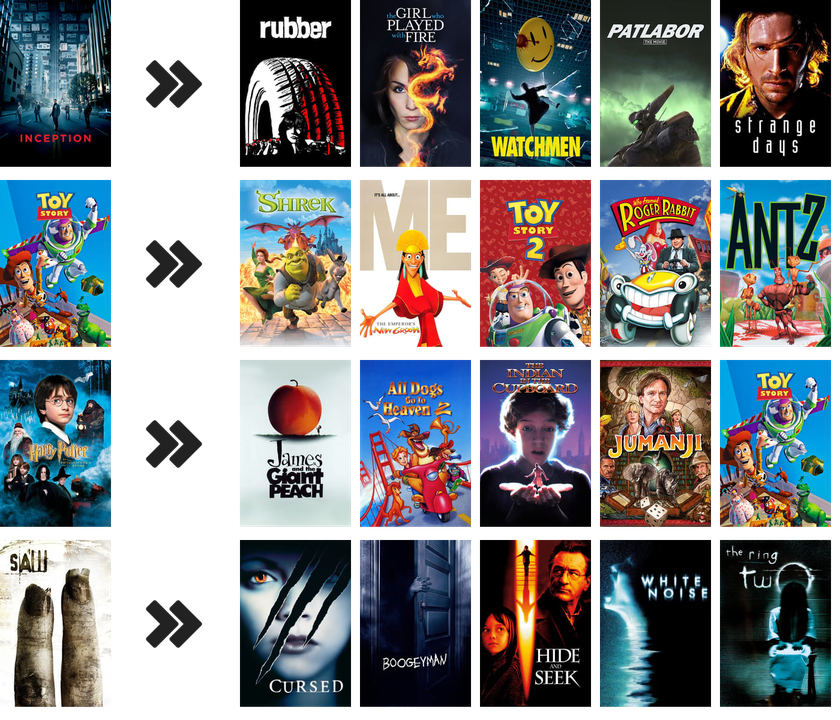

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
        
    recommendation = content_based_recommendation(movie_id, movielens, k=5)
    
    recommendation = [*recommendation]
    
    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

# KNN
★★★

The only problem of this algorithm is the speed... And we must keep the dataset in memory to perform recommendations
## Algorithm

In [0]:
def distance(a, b, cosine=True):
    if cosine:
        la = np.sum(np.square(a)) ** 0.5
        lb = np.sum(np.square(b)) ** 0.5

        return 1 - (np.dot(a, b) / (la * lb))
    
    return np.sum(np.square(a - b))
        
def KNN(target_index, vectors, k=5, cosine=True):
    """
    Calcul the K nearests neighbors of the target item
    Work on columns (items)
    
    Params
    ======
    - target_index (int)   : Index of the target column
    - vectors (np.ndarray) : Numpy 2D array rows: item vector
    - k (int)              : Number of neighbors to return    
    """
    # Array of best item [distance, item_id]
    best_items = [[np.inf, 0]] * k
    
    target_item = vectors[target_index]
    
    for item_id, item_vector in enumerate(vectors):
        if item_id == target_index:
            continue
        
        dist = distance(target_item, item_vector, cosine=cosine)
        
        if [dist, 0] < best_items[-1]:
            del best_items[-1]
            best_items.append([dist, item_id])
            best_items.sort()
    
    # Keep only item id
    best_items = np.array(best_items)
    best_items = best_items[:, 1].reshape(1, -1)[0].astype(int)
    
    return best_items

## Item-Item | Recommendation

In [0]:
def KNN_movielens_recommendation(rating_df, movie_id, k=5, cosine=True):
    """
    Recommend items based on the distance
    Then show movies images
    
    Params
    ======
    - rating_df (pd dataframe) : Matrix representaing items (cols: items)
    - movie_id (int)           : Id of the target movie
    - cosine (bool)            : Use cosine function as similarity function
    """
    
    items_id = rating_df.columns
    
    u_movie_id = np.where(items_id == movie_id)[0][0]
        
    recommendations = KNN(u_movie_id, rating_df.as_matrix().T, k=k, cosine=cosine)
    
    # Convert u_item_id (index in rating matrix) to movie ID
    recommendations = np.concatenate(([movie_id, None], items_id[recommendations]))
    
    show_movies(recommendations, movielens)


Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


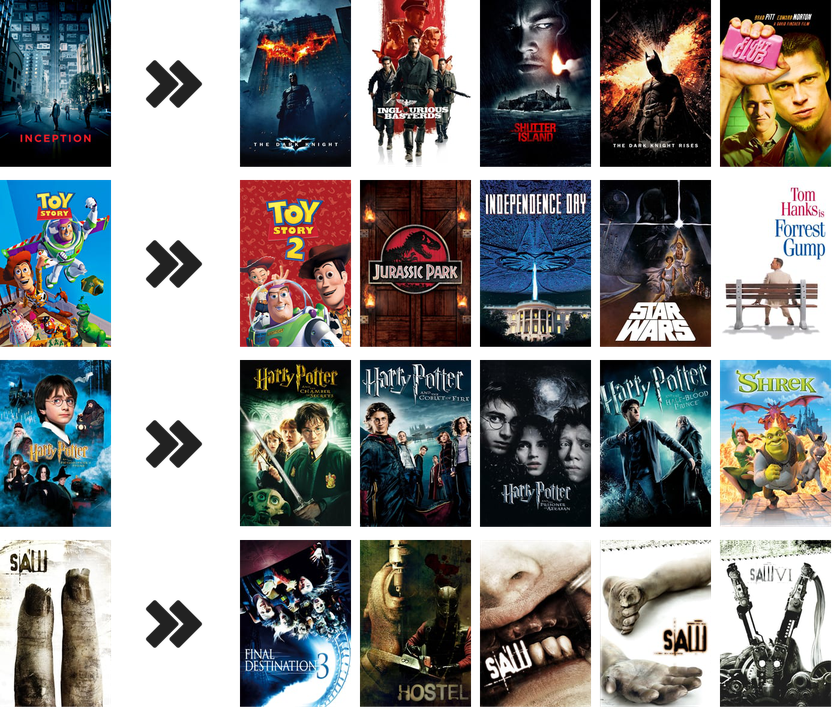

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, movielens.ratings_matrix.T, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

# MF | SVD

## Scipy
★★★

### Model

In [0]:
from scipy.sparse.linalg import svds

U, sigma, Vt = svds(movielens.ratings_matrix, k=20)

# We keep only the diagonal
sigma = np.diag(sigma)

# Perform predictions and fill null values
predictions = np.dot(np.dot(U, sigma), Vt)
predictions = pd.DataFrame(predictions, columns=movielens.items_id)
predictions.head()

,1,2,3,4,5,6,7,8,9,10,...,193565,193567,193571,193573,193579,193581,193583,193585,193587,193609
0,2.290336,1.460203,1.033507,-0.061334,-0.002275,1.243261,0.029650,0.056161,0.036220,1.442856,...,-0.008584,-0.007358,-0.009810,-0.009810,-0.008584,-0.009810,-0.008584,-0.008584,-0.008584,-0.038606
1,0.038570,0.015272,0.016968,0.002944,0.019201,-0.005821,-0.025436,0.000918,0.010531,-0.117149,...,0.010662,0.009139,0.012186,0.012186,0.010662,0.012186,0.010662,0.010662,0.010662,0.015610
2,-0.015220,0.049067,0.047202,-0.004936,-0.035349,0.052758,-0.012911,0.010422,-0.002532,-0.014094,...,0.000029,0.000025,0.000033,0.000033,0.000029,0.000033,0.000029,0.000029,0.000029,-0.002412
3,2.238621,0.060011,0.039384,0.066455,0.221806,0.487591,0.318594,-0.057422,0.016371,0.234273,...,0.002029,0.001739,0.002319,0.002319,0.002029,0.002319,0.002029,0.002029,0.002029,-0.007359
4,1.358363,0.970071,0.340939,0.121053,0.479936,0.628346,0.504583,0.136293,0.040721,1.122003,...,0.000348,0.000299,0.000398,0.000398,0.000348,0.000398,0.000348,0.000348,0.000348,0.001611


### Item-Item | First recommendation
We can use the matrix filled with predictions to perform KNN

But, we have no advantage compared to KNN algorithm

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    KNN_movielens_recommendation(predictions, movie_id, k=5)

### Item-Item | Second recommendation
A clever way is to use the compressed vectors...

It will be faster, and we can see that the recommendation is more logic

We have extracted the "meaning" of the items vectors

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

items_vector = pd.DataFrame(Vt, columns=movielens.items_id)

for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    KNN_movielens_recommendation(items_vector, movie_id, k=5)

### User-Item | Recommendation

Favorite user movie


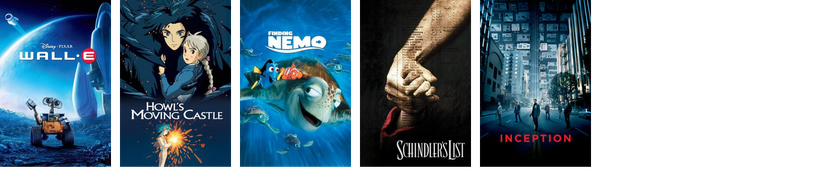

Recommendation
	 Notes
	  [2.80240421 2.98868838 3.25558147 3.7241902  4.24163393]
	 Movies


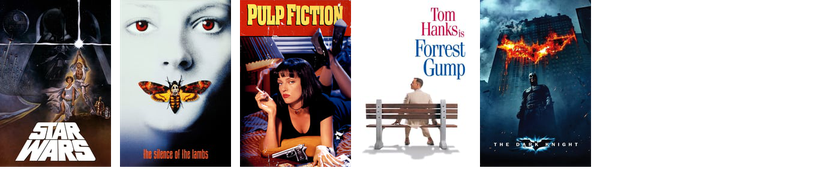

In [0]:
user_id = 601
k = 5

u_user_id = np.where(movielens.users_id == user_id)[0][0]


print('Favorite user movie')
show_movies(movielens.items_id[movielens.ratings_matrix[u_user_id, :].argsort()[-k:]], movielens)


print('Recommendation')


predictions = np.dot(np.dot(U, sigma), Vt)

# Keep only unseen movies
movies = predictions[u_user_id, :] - movielens.ratings_matrix[u_user_id, :]

best_movies = movies.argsort()[-k:]

print('\t Notes')
print('\t ', predictions[u_user_id, best_movies])

print('\t Movies')
recommended_movies_id = movielens.items_id[best_movies]
show_movies(recommended_movies_id, movielens)


## Numpy
★★★

A little slower than Scipy

### Model

In [0]:
def VDS(matrix, k=20):
    U, S, Vh = np.linalg.svd(matrix)
              
    
    # Keep the K biggest value in S
    return U[:, :k], Vh[:k, :]
    

U, V = VDS(movielens.ratings_matrix, k=20)

### Item-Item | Recommendation

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


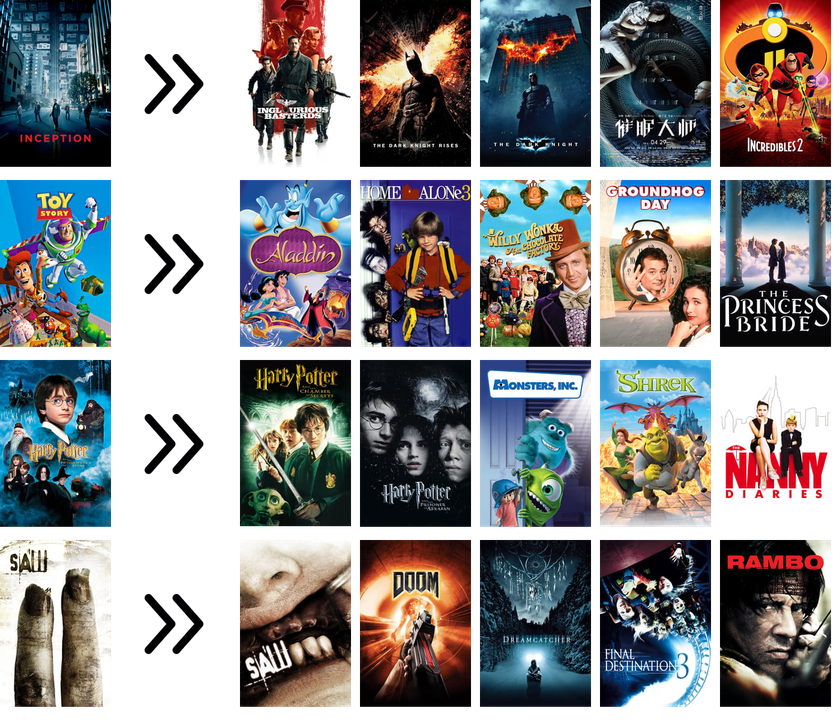

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, V.T, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

#NMF | sklearn
Non-negative matrix factorization

## Model

In [0]:
from sklearn.decomposition import NMF

R = movielens.ratings_matrix

nmf = NMF()
U = nmf.fit_transform(R)
V = nmf.components_

## Item-Item | Recommendation

In [0]:
# Using angle between vector
pd_items_vectors = pd.DataFrame(V.T, columns=movielens.items_id)

movie_id = movielens.search_movie('inception')
print(movie_id)

KNN_movielens_recommendation(pd_items_vectors, movie_id, k=15)

# MF | ALSM
★★★★

Alternating least squares method

## Implicit

### Installation

In [0]:
! pip install implicit

### Learning

In [0]:
import implicit
import scipy

model = implicit.als.AlternatingLeastSquares(factors=50)


r = scipy.sparse.csc_matrix(movielens.ratings_matrix.T)
model.fit(r)

### Item-Item | Recommendation

In [0]:
# Recommendation for Saw II (id: 48877)
# Inception: 79132
# Serbian film: 79251
# Alice aux pays des merveilles: 80748
# Shutter island : 74458

item_id = 79132

u_item_id = np.where(movielens.items_id == item_id)[0][0]

related = model.similar_items(u_item_id, N=16)

related = np.array(related)[:, 0].astype(int)[1:]

related = movielens.items_id[related]

show_movies(related, movielens)

In [0]:
# Using my own KNN
items_vectors_df = pd.DataFrame(model.item_factors.T, columns=movielens.items_id)

KNN_movielens_recommendation(items_vectors_df, 79132, k=10)

## Numpy

### Learning

In [0]:
def MF_ALSM(R, k=50, steps=20, lambda_=0.05, use_np_solve=False, verbose=True):
    """
    Perform matrix factorization using 'Alternating least squares method'
    
    Params
    ======
    - matrix (np.array)   : Matrix to factorize
    - k (int)             : Dimension of features
    - steps (int)         : Number of iterations
    - lambda_ (float)     : Regularization term
    - use_np_solve (bool) : Use numpy solver instead of inverse the matrix
    - verbose (bool)      : Print information
    """
    
    m, n = R.shape
    
    U = np.random.rand(m, k) 
    V = np.random.rand(n, k)
        
    for step in range(1, steps + 1):
        if verbose and step % 100 == 0 : print('Step ', step)
        
        if use_np_solve:
            # Using the numpy solver
            U = np.linalg.solve(np.dot(V.T, V) + lambda_ * np.eye(k), 
                                np.dot(V.T, R.T)).T

            V = np.linalg.solve(np.dot(U.T, U) + lambda_ * np.eye(k),
                                np.dot(U.T, R)).T
        
        else:     
            # Inverse matrix
            U = np.linalg.inv(np.dot(V.T, V) + lambda_ * np.eye(k)).dot(V.T.dot(R.T)).T
            
            V = np.linalg.inv(np.dot(U.T, U) + lambda_ * np.eye(k)).dot(U.T.dot(R)).T
        
    return U, V


U, V = MF_ALSM(movielens.ratings_matrix, steps=100)

Step  100


### Item-Item | Recommendation

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


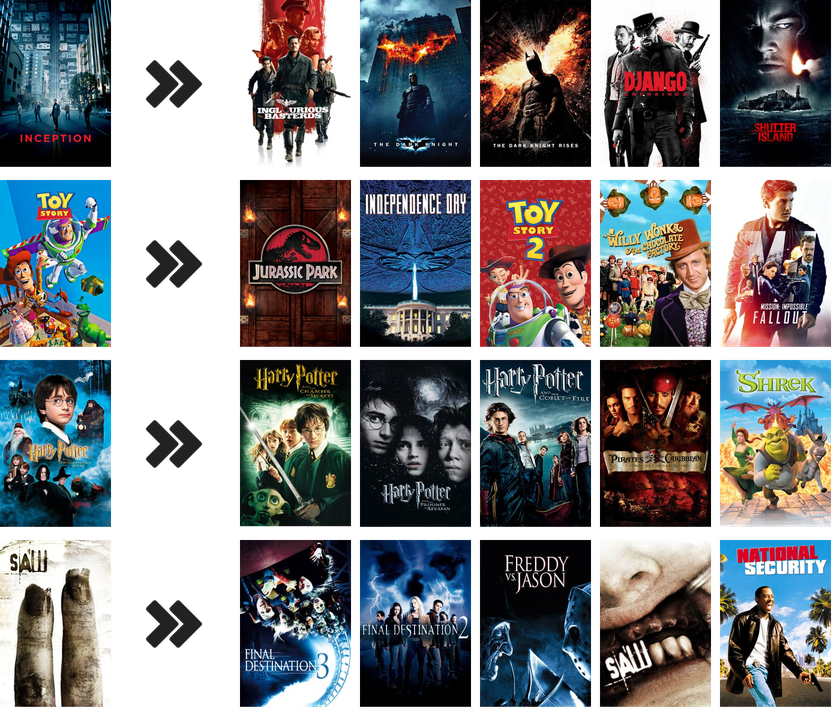

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, V, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

### User-Item | Recommendation

Favorite user movie
[    50   4226   7153   2324    904  76093 134853    858   5618  59315
   1197   8961  50872   1203   2571  60069  31658   6377    527  79132]


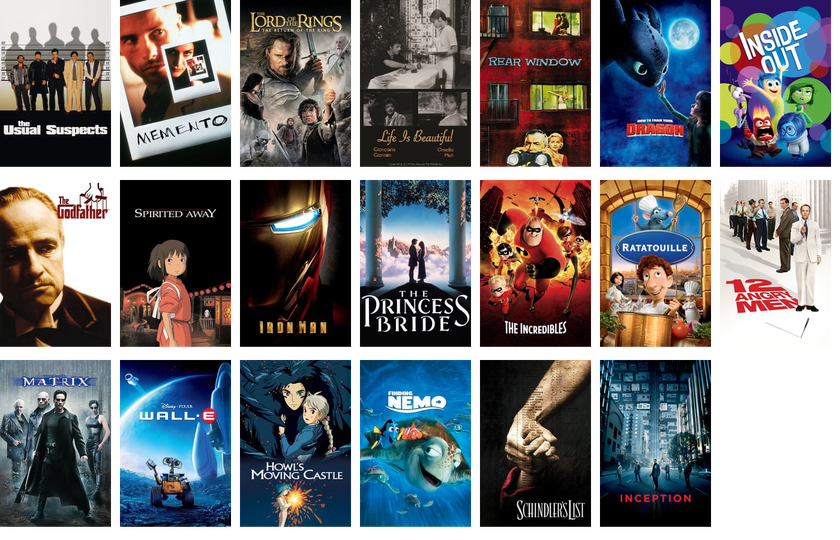

Recommendation
	 Notes
[1.60167271 1.61047677 1.63535166 1.7090502  1.79941957 1.81732226
 1.82218634 1.90457136 1.91176178 1.93894687 2.0159932  2.10323694
 2.21275243 2.25166336 2.28968575 2.29956698 2.70510873 2.96892885
 3.86072369 4.40562058]
	 Movies


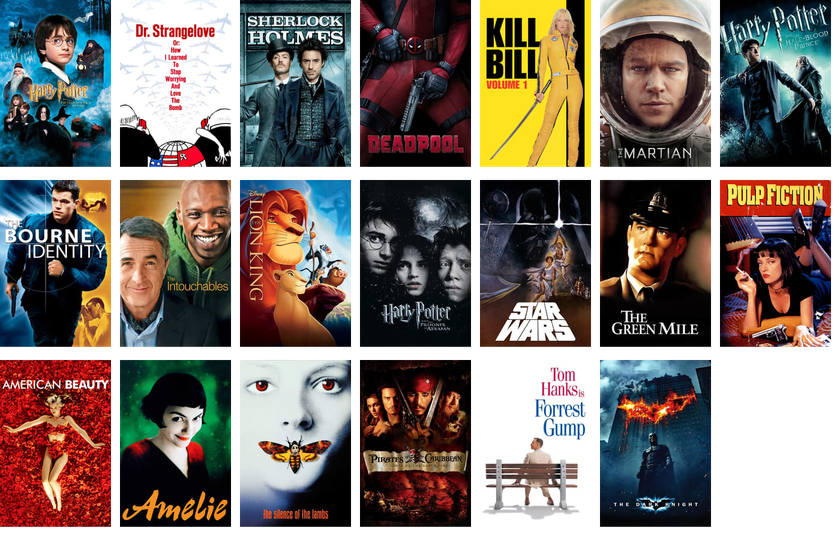

In [0]:
user_id = 601
k = 20

u_user_id = np.where(movielens.users_id == user_id)[0][0]

print('Favorite user movie')
favorite_movies = movielens.items_id[movielens.ratings_matrix[u_user_id, :].argsort()[-k:]]

print(favorite_movies)

show_movies(favorite_movies, movielens)



print('Recommendation')
predictions = U[u_user_id, :].dot(V.T).T

# Keep only unseen movies

seen_movies = (np.copy(movielens.ratings_matrix[u_user_id, :]) == 0).astype(int)

movies = predictions * seen_movies

best_movies = movies.argsort()[-k:]

print('\t Notes')
print(predictions[best_movies])

print('\t Movies')
recommended_movies_id = movielens.items_id[best_movies]
show_movies(recommended_movies_id, movielens)

# MF | SGD
Stochastic gradient descent

Stochastic because gradient is on "simple rating" and not on "all users/items vectors"

## Learning

In [0]:
def SGG_error(R, W, U, V, lambda_):
    
    n = W.sum()
    
    error = np.square(R-(U.dot(V.T)*W)).sum() + lambda_ * np.sum(np.square(U)) + lambda_ * np.sum(np.square(V))
    
    return error / n

def MF_SGD(R, k=40, steps=200, alpha = 0.001, lambda_ = 0.005):
    """
    Perform matrix factorization using 'Stochastic gradient descent'
    
    Params
    ======
    - matrix (np.array) : Matrix to factorize
    - k (int)           : Dimension of features
    - steps (int)       : Number of iterations
    - alpha (float)     : Learning rate
    - lambda_ (float)   : Regularization term
    """
    
    m, n = R.shape
    
    U = np.random.randn(m, k) / m
    V = np.random.randn(n, k) / n
    
    W = (R!=0).astype(np.double)
    
    R = (R - R.mean()) * W
        
    for step in range(1, steps+1):
        if step % 10 == 0:
            print('Step ', step)
            print('Error ', SGG_error(R, W, U, V, lambda_))
        
        PRED = U.dot(V.T)*W
        
        U += alpha * ((R - PRED).dot(V) - lambda_ * U)

        V += alpha * (U.T.dot(R - PRED).T - lambda_ * V)
    
    return U, V

R = movielens.ratings_matrix.copy()
R /= 5

U, V = MF_SGD(R, steps=200)

Step  10
Error  0.5173765019667681
Step  20
Error  0.5173737306402432
Step  30
Error  0.5173579728250918
Step  40
Error  0.5172378391349391
Step  50
Error  0.5162708071628408
Step  60
Error  0.5085976302015136
Step  70
Error  0.45788113045024664
Step  80
Error  0.31736794413879565
Step  90
Error  0.2150966139623869
Step  100
Error  0.15958028233519836
Step  110
Error  0.12639679882088398
Step  120
Error  0.105042827651771
Step  130
Error  0.09036347148096058
Step  140
Error  0.07972196783008635
Step  150
Error  0.0716808647474183
Step  160
Error  0.06540444570734238
Step  170
Error  0.06037788453708586
Step  180
Error  0.05626760620908248
Step  190
Error  0.052848027112631445
Step  200
Error  0.04996109354902533


## Item-Item | Recommendation

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


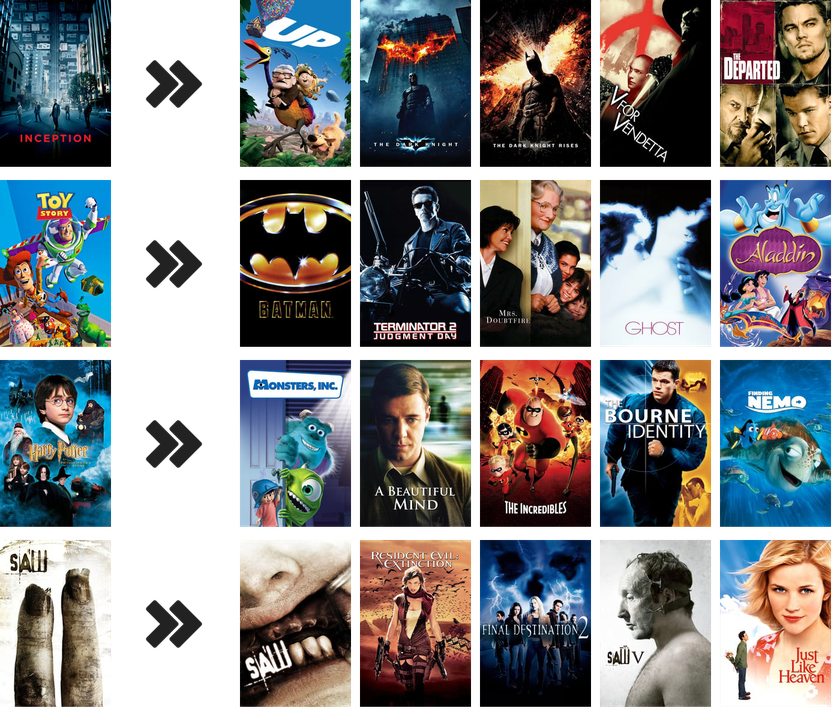

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, V, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

# NN | Keras

Deep learning

## Prepare data

In [0]:
pd_ratings = movielens.pd_ratings.copy()

n_users, n_items = movielens.n_users, movielens.n_items

## Model

In [0]:
import keras
from keras import Model
from keras.models import Sequential
from keras.layers import *

def model_deep(k_factors=100):
    # Layers
    layer_user_id = Input(shape=(1,), name='user_id')
    layer_item_id = Input(shape=(1,), name='item_id')

    layer_users_vectors = Embedding(n_users, k_factors, name='users_vectors')(layer_user_id)
    layer_items_vectors = Embedding(n_items, k_factors, name='items_vectors')(layer_item_id)

    layer_data = Concatenate(name='mutiply')([layer_users_vectors, layer_items_vectors])

    output = Flatten()(layer_data)
    
    output = Dense(100)(output)
    
    output = Dropout(0.5)(output)
    
    output = Dense(1)(output)
    
    # Model
    model = Model(inputs=[layer_user_id, layer_item_id], outputs=[output])
    return model


def model_multiply(k_factors=100):
    # Layers
    layer_user_id = Input(shape=(1,), name='user_id')
    layer_item_id = Input(shape=(1,), name='item_id')

    layer_users_vectors = Embedding(n_users, k_factors, name='users_vectors')(layer_user_id)
    layer_items_vectors = Embedding(n_items, k_factors, name='items_vectors')(layer_item_id)

    layer_data = Multiply(name='mutiply')([layer_users_vectors, layer_items_vectors])

    layer_user_bias = Embedding(n_users, 1, name='users_bias')(layer_user_id)    
    layer_item_bias = Embedding(n_items, 1, name='items_bias')(layer_item_id)

    layer_data = Concatenate()([layer_data, layer_user_bias, layer_item_bias])

    output = Flatten()(layer_data)
    
    output = Dropout(0.25)(output)
    
    output = Dense(1, activation='relu')(output)
    
    # Model
    model = Model(inputs=[layer_user_id, layer_item_id], outputs=[output])
    return model


def model_matrix_factorization(k_factors=100):
    # Layers
    layer_user_id = Input(shape=(1,), name='user_id')
    layer_item_id = Input(shape=(1,), name='item_id')

    layer_users_vectors = Embedding(n_users, k_factors, name='users_vectors')(layer_user_id)
    layer_items_vectors = Embedding(n_items, k_factors, name='items_vectors')(layer_item_id)
    
    product = Dot(name='mutiply', axes=2)([layer_users_vectors, layer_items_vectors])
    
    output = Flatten()(product)
            
    output = Dense(1, activation='relu')(output)

    # Model
    model = Model(inputs=[layer_user_id, layer_item_id], outputs=[output])
    return model

## Optimize model

In [0]:
p_k_factors = [3, 5, 10, 15, 20, 50, 100, 150 , 200]


x_train = [pd_ratings['u_user_id'].values, pd_ratings['u_item_id'].values]
y_train = pd_ratings['rating'].values


for k_factors in p_k_factors:
    print('-' * 15 + 'Factors, ', k_factors, '-' * 15)
    
    # Training
    model = model_multiply(k_factors)

    model.compile('adam', 'mse', metrics=['mse', 'mae', 'acc'])
    
    history = model.fit(x=x_train, y=y_train, epochs=5, verbose=0, validation_split=0.1)
    
    # Loss
    print(history.history['val_loss'])
    
    # Recommendation
    items_vectors = model.get_layer(name='items_vectors').get_weights()[0]
    
    movies = ['inception', 'toy story', 'harry potter', 'saw ii']

    for movie in movies:
        movie_id = movielens.search_movie(movie)
        print('Recommendation for, ', movielens.movie_name(movie_id))

        items_vector = pd.DataFrame(items_vectors.T, columns=movielens.items_id)

        KNN_movielens_recommendation(items_vector, movie_id, k=5)




## Show model

In [0]:
#model = model_matrix_factorization(200)
model = model_multiply(100)

model.compile('adam', 'mse')

model.summary()

In [0]:
from keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

import IPython.display

IPython.display.Image('model.png', width=700)

## Training

In [0]:
def shuffle(x_train, y_train):
    rng_state = np.random.get_state()
    np.random.shuffle(y_train)
    
    np.random.set_state(rng_state)
    np.random.shuffle(x_train[0])
    
    np.random.set_state(rng_state)
    np.random.shuffle(x_train[1])
    

fake_users = np.random.randint(0, n_users-1, size=pd_ratings.shape[0])
fake_items = np.random.randint(0, n_items-1, size=pd_ratings.shape[0])
fake_labels = np.zeros(pd_ratings.shape[0])

x_train = [np.concatenate((pd_ratings['u_user_id'].values, fake_users)), 
           np.concatenate((pd_ratings['u_item_id'].values, fake_users))]

y_train = np.concatenate((pd_ratings['rating'].values, fake_labels))

shuffle(x_train, y_train)


history = model.fit(x=x_train, y=y_train, epochs=5, verbose=1, validation_split=0.1)

# svae the model
from datetime import datetime
model.save('deep_model_%s.h5' % str(datetime.now()))

# print training loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.xticks(np.arange(len(history.history['loss'])))
plt.show()

## Item-Item  | Recommendation

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

items_vectors = model.get_layer(name='items_vectors').get_weights()[0]

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, items_vectors, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

## User-Item | Recommendation

In [0]:
user_id = 600

k = 5

users_vectors = model.get_layer(name='users_vectors').get_weights()[0]

u_user_id = np.where(movielens.users_id == user_id)[0][0]


print('Favorite user movie')
show_movies(movielens.items_id[movielens.ratings_matrix[u_user_id, :].argsort()[-k:]], movielens)


print('Recommendations')
predictions = model.predict([ np.array([u_user_id] * movielens.n_items), np.arange(0, movielens.n_items)])

predictions = predictions.T[0]

best_u_item_id = predictions.argsort()[-k:][::-1]

# Convert u_user_id to user_id
best_item_id = movielens.items_id[best_u_item_id]

show_movies(best_item_id, movielens)

## Conclusion
Mauvaise prédiction.

Avec seulement 2-3 features apprises, nous avons de bonne perf

Mon interprétation: on apprend 2-3 features, et le reste est de l'overfitting...



# Next item based
Look at the next item and recommend the items which are viewed most frequently directly after the target item.

$ W = Rate * Sparse $

$ Item_V = \sum_i W_i $ 

Sparse make a '5/5' much more important than a '4/5'... We want to faforise a '5/5' absolutely.

## Model

In [0]:
from collections import Counter

class NextItemBased():
    def __init__(self):
        # [ source : [dest : value, dest : value,... ], source : ... ]
        self.views = {}
        
    
    def add_view(self, prev_item, next_item, value=1):
        """
        Add a view for an user
        Value can be the rating of the next item
        """
        if prev_item not in self.views:
            self.views[prev_item] = {}
        
        if next_item not in self.views[prev_item]:
            self.views[prev_item][next_item] = 0
        
        self.views[prev_item][next_item] += value
    
    def recommend(self, target_item, k=5): 
        """
        Recommend 'k' items for the target item
        """
        return sorted(self.views[target_item], key=self.views[target_item].get)[-k:][::-1]

In [0]:
next_item_based = NextItemBased()

## Feed the model

In [0]:
def feed_next_item_based(next_item_based, dataset, sparse=10):
    users_id = dataset.users_id
    ratings = dataset.pd_ratings
        
    for u in users_id:

        rates_i = ratings[ratings['user_id']==u]

        rates_i = rates_i.sort_values('timestamp')

        prev_item = None

        for i, row in rates_i.iterrows():

            if prev_item is None:
                prev_item = row['item_id']
                continue

            next_item = row['item_id']
            
            rating = row['rating']
            
            next_item_based.add_view(prev_item, next_item, rating * sparse)
            
            prev_item = next_item

feed_next_item_based(next_item_based, movielens)

## Item-Item | Recommendation

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


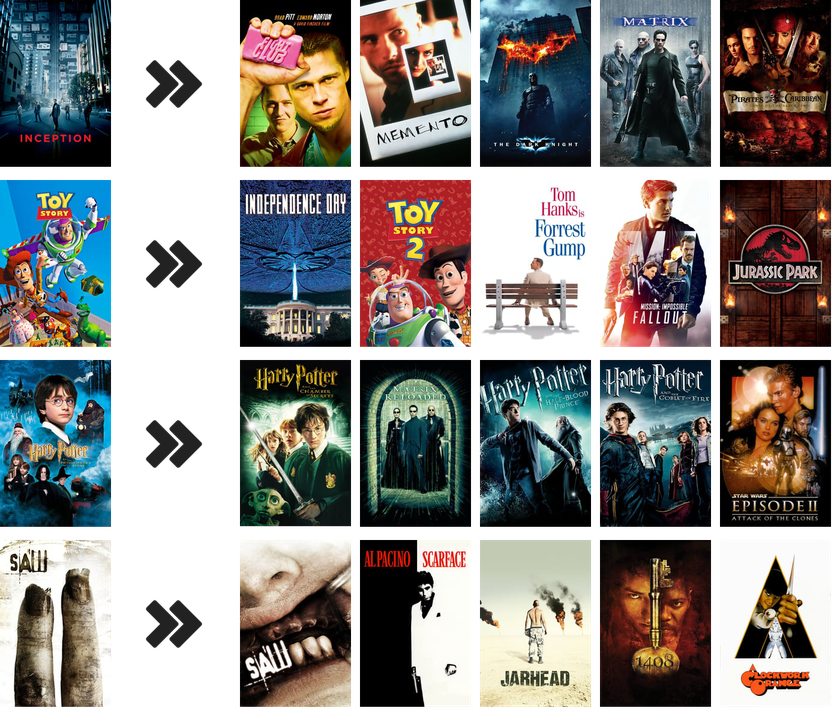

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
        
    recommendation = next_item_based.recommend(movie_id, k=5)

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

# Item2Vec

Try to vectorize item, based on the same idea of Word2Vec.

We put the ID of the vector as input

And we want to predict the "context" of this items

Faire attention que les vecteurs tendent pas vers 0....

## Params

In [0]:
# 'context_size' items before and 'context_size' after the current item
context_size = 2

# Size of the calculated item vector
vector_size = 100

## Prepare data

In [0]:
n_users, n_items = movielens.n_users, movielens.n_items

pd_ratings = movielens.pd_ratings.copy().sort_values(by=['u_user_id', 'timestamp'])

pd_ratings_user_grouper = pd_ratings.groupby('u_user_id')

users_sequences = pd_ratings_user_grouper['u_item_id'].apply(np.array).values

## Model

In [0]:
import keras
from keras import Model
from keras.models import Sequential
from keras.layers import *


k_factors = 100
window_size = 5


layer_input = Input((window_size,))

layer_output = Embedding(n_items, k_factors, input_length=window_size, name='items_vectors')(layer_input)

layer_output_split = []

for i in range(window_size):
    x = Lambda(lambda x : x[:, i], name='split_%i'%i)(layer_output)
    
    layer_output_split.append(x)
    
layer_output = Add()(layer_output_split)

layer_output = Dense(1, activation='sigmoid')(layer_output)

model = Model(inputs=layer_input, outputs=layer_output)

model.compile(loss='mse', optimizer='adam')

from keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

import IPython.display

IPython.display.Image('model.png', width=1200)

In [0]:
def fit_generator(batch_size=1): 
    
    while True:
        for user_sequence in users_sequences:
        
            window = [-1] * window_size

            for u_item_id in user_sequence:
                
                window = [u_item_id] + window[:-1]
                
                if window[-1] >= 0:
                                        
                    yield (np.array([window]), np.array([1]))
                    
                    fake_window = np.random.choice(range(n_items), window_size, replace=False)
                    
                    yield (np.array([fake_window]), np.array([0]))
                    
                    
            

model.fit_generator(fit_generator(batch_size=1), steps_per_epoch=pd_ratings.size, 
                    verbose=1, epochs=1,
                    max_queue_size=32)

model.save('model_item2vec_%i.h5' % vector_size)

## Item-Item | Recommendation

In [0]:
# Item-Item | Recommendation

items_vectors = model.get_layer(name='items_vectors').get_weights()[0]

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))

    items_vector = pd.DataFrame(items_vectors.T, columns=movielens.items_id)

    KNN_movielens_recommendation(items_vector, movie_id, k=5)

# Auto-encoder

Try to autoencode the vector

## Model 1

In [0]:
n_users, n_items = movielens.n_users, movielens.n_items

ratings_matrix = movielens.ratings_matrix

k_factors = 80

In [0]:
import keras
from keras import Model
from keras.models import Sequential
from keras.layers import *


layer_item_id = Input(shape=(1,), name='item_id')

layer_item_vector_compressed = Embedding(n_items, k_factors, name='items_vectors')

layer_item_ratings = Dense(n_users)(layer_item_vector_compressed(layer_item_id))

model = Model(layer_item_id, layer_item_ratings)

model.compile('adam', 'mse', metrics=['mse', 'mae', 'acc'])

model.summary()

Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
item_id (InputLayer)         (None, 1)                 0         
_________________________________________________________________
items_vectors (Embedding)    (None, 1, 80)             777920    
_________________________________________________________________
dense_1 (Dense)              (None, 1, 610)            49410     
Total params: 827,330
Trainable params: 827,330
Non-trainable params: 0
_________________________________________________________________


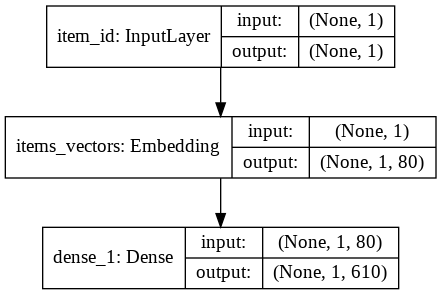

In [0]:
from keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

import IPython.display
IPython.display.Image('model.png', width=400)

In [0]:
x_train = np.arange(n_items)
y_train = ratings_matrix.T

y_train = y_train.reshape(n_items, 1, n_users)

model.fit(x=x_train, y=y_train, epochs=50, verbose=1, validation_split=0)

from datetime import datetime
model.save('model_autoencoder_%s.h5' % str(datetime.now()))

Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


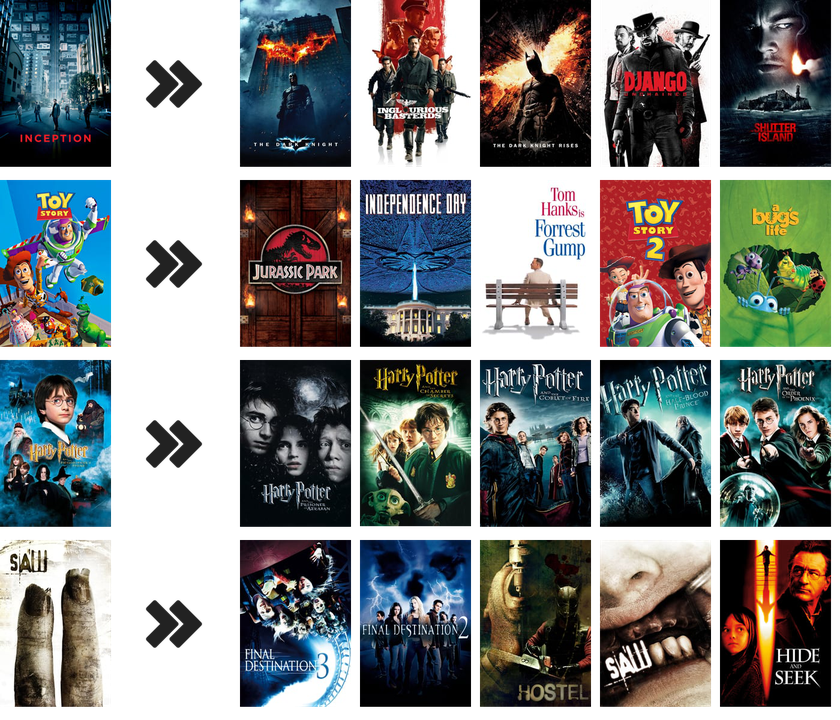

In [0]:
# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

items_vectors = model.get_layer(name='items_vectors').get_weights()[0]

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, items_vectors, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

## Model 2
Try to compress ratings

Input == Output

In [0]:
n_users, n_items = movielens.n_users, movielens.n_items

ratings_matrix = movielens.ratings_matrix

k_factors = 80

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
item_rating (InputLayer)     (None, 610)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 80)                48880     
_________________________________________________________________
dense_3 (Dense)              (None, 610)               49410     
Total params: 98,290
Trainable params: 98,290
Non-trainable params: 0
_________________________________________________________________
None


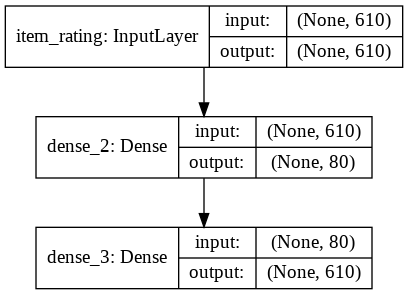

In [0]:
import keras
from keras import Model
from keras.models import Sequential
from keras.layers import *


layer_item_ratings = Input(shape=(n_users,), name='item_rating')

layer_item_compressed = Dense(k_factors)(layer_item_ratings)

layer_item_ratings_ = Dense(n_users)(layer_item_compressed)



model = Model(layer_item_ratings, layer_item_ratings_)

model.compile('adam', 'mse', metrics=['mse', 'mae', 'acc'])

print(model.summary())

from keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

import IPython.display
IPython.display.Image('model.png', width=400)

In [0]:
x_train = ratings_matrix.T
y_train = ratings_matrix.T

model.fit(x=x_train, y=y_train, epochs=1, verbose=1, validation_split=0)

from datetime import datetime
model.save('model_autoencoder_%s.h5' % str(datetime.now()))

Epoch 1/1
9724/9724 [==============================] - 1s 135us/step - loss: 0.1766 - mean_squared_error: 0.1766 - mean_absolute_error: 0.1565 - acc: 0.3420


Recommendation for,  Inception (2010)
Recommendation for,  Toy Story (1995)
Recommendation for,  Harry Potter and the Sorcerer's Stone (a.k.a. Harry Potter and the Philosopher's Stone) (2001)
Recommendation for,  Saw II (2005)


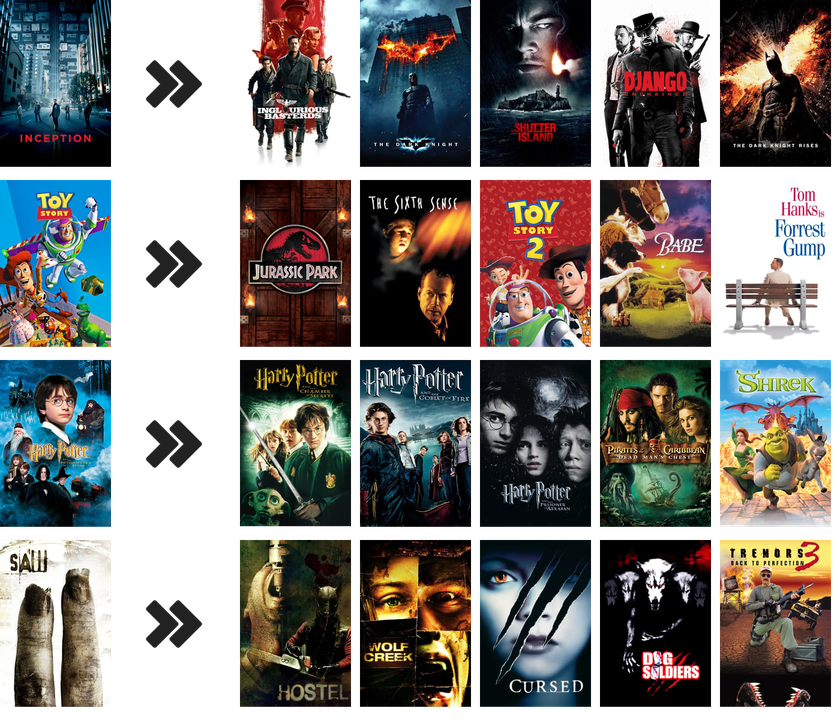

In [0]:
# Compress vectors using model
compress_model = Model(layer_item_ratings, layer_item_compressed)
items_vectors = compress_model.predict(ratings_matrix.T)

# Item-Item | Recommendation

movies = ['inception', 'toy story', 'harry potter', 'saw ii']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    print('Recommendation for, ', movielens.movie_name(movie_id))
    
    u_movie_id = movielens.u_items_id[movie_id]
    
    recommendation = KNN(u_movie_id, items_vectors, 5)
    
    recommendation = movielens.items_id[recommendation]

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)

# Word2vec

In [0]:
users_id = movielens.users_id
ratings = movielens.pd_ratings

In [0]:
sentences = [
    [str(i) for i in ratings[ratings['user_id'] == user_id].sort_values('timestamp')['item_id'].values]
    for user_id in users_id
]

In [0]:
from gensim.models import Word2Vec


w2v_model = Word2Vec(
    min_count=2,
    window=10,
    size=80,
    sample=6e-5,
    alpha=0.1,
    min_alpha=0.007, 
    negative=20
)

w2v_model.build_vocab(sentences, progress_per=10000)

In [0]:
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=1000, report_delay=1)

(58191467, 100836000)

In [0]:
len(w2v_model.wv.vocab)

6278

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[99114, 112552, 109487, 58559, 2959]
[1265, 588, 2918, 45928, 1079]
[5816, 40815, 8368, 100611, 5481]
[48877, 43679, 36509, 55577, 52950]


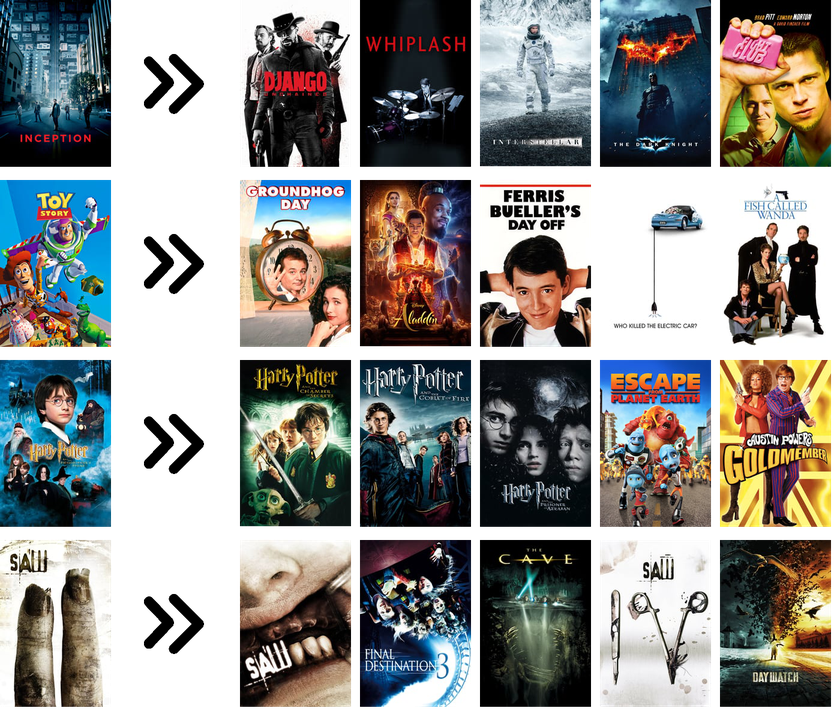

In [0]:
movies = ['inception', 'toy story', 'harry potter', 'saw II']

recommendations = []
for movie in movies:
    movie_id = movielens.search_movie(movie)
    
    u_movie_id = movielens.u_items_id[movie_id]
        
    recommendation = w2v_model.wv.most_similar(positive=[str(movie_id)], topn=5)
    
    recommendation = [int(r[0]) for r in recommendation]
    
    print(recommendation)

    recommendations.extend((movie_id, None, *recommendation))


show_movies(recommendations, movielens)